In [2]:
cnfl=[true]
include("PVCR.jl")

┌ Warning: PyPlot is using tkagg backend, which is known to cause crashes on MacOS (#410); use the MPLBACKEND environment variable to request a different backend.
└ @ PyPlot /Users/arnavgautam/.julia/packages/PyPlot/4wzW1/src/init.jl:192
┌ Warning: `@pyimport foo` is deprecated in favor of `foo = pyimport("foo")`.
│   caller = _pywrap_pyimport(::PyObject) at PyCall.jl:399
└ @ PyCall /Users/arnavgautam/.julia/packages/PyCall/kAhnQ/src/PyCall.jl:399


12-element Array{Float64,1}:
 42.35930677572868 
 43.0785589650421  
 42.394224465839216
 45.343163807121606
 42.29728640436372 
 42.56605829576826 
 41.027884582241974
 40.784783966947366
 40.47773068077983 
 42.012421645464734
 43.00006019721416 
 40.152405298225425

In [3]:
include("functions/plotting_base_gd.jl")

plot_segmented_tariff_category_with_regression (generic function with 3 methods)

In [4]:
# Read in all of the utility bills for the various utilities and tariff types
base_GD = CSV.read("data/Base_GD.csv")

# Narrow down to {Residential | Commerical Industrial | Medium Voltage} CNFL customers

all_cnfl = filter(row -> (!ismissing(row.EMPRESA) && row.EMPRESA == "CNFL"), base_GD)

,ANNO,MES,ENERGIA_GENERADA,ENERGIA_DEPOSITADA,ENERGIA_RETIRADA,IMPORTE_POR_ENERGIA_RETIRADA
,Int64,Int64,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,2018,1,209.0,117.0,102.0,2145.0
2,2018,2,235.0,122.0,115.0,2420.0
3,2018,3,305.0,169.0,149.0,3135.0
4,2018,4,355.0,217.0,173.0,3640.0
5,2018,5,338.0,185.0,165.0,3470.0
6,2018,1,432.0,296.0,211.0,4435.0
7,2018,2,482.0,323.0,236.0,4965.0
8,2018,3,614.0,448.0,300.0,6310.0
9,2018,4,710.0,547.0,293.0,6160.0


In [5]:
# Function to calculate optimal capacity under various conditions
res_consumption = vcat(100:100:1500, 2000:500:4000)

function get_optimal_capacity(;APR=0.085, years_to_payoff=5)
    new_BAC1 = Financial(0.045, APR, years_to_payoff, 0.25, 600.0);
    res_model_predictions = []
    for (ix, co) in enumerate(res_consumption)
        cnfl_residential.econsumption = co; get_pmax(cnfl_residential);
        res = optimal_pv(cnfl_residential, PVRes, 0.0:0.5:15, new_BAC1, tariff_increase = true)
        push!(res_model_predictions, res[1][2])
    end
    plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, res_model_predictions)
end

get_optimal_capacity (generic function with 1 method)

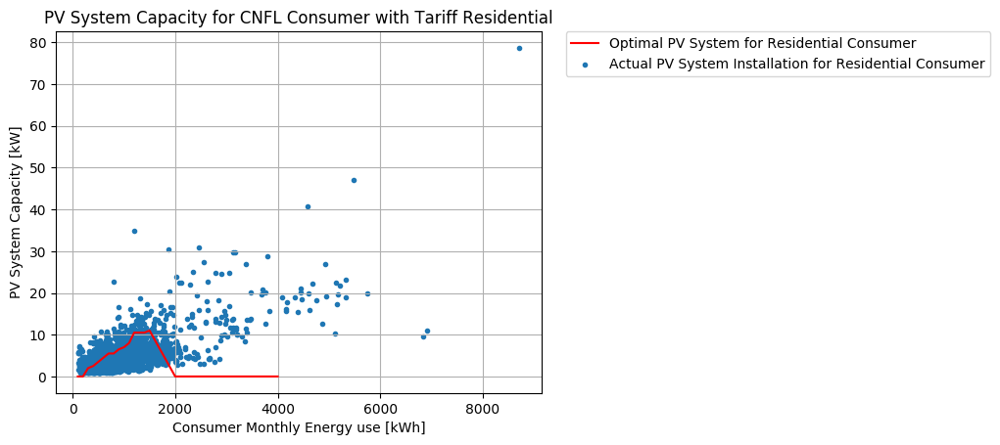

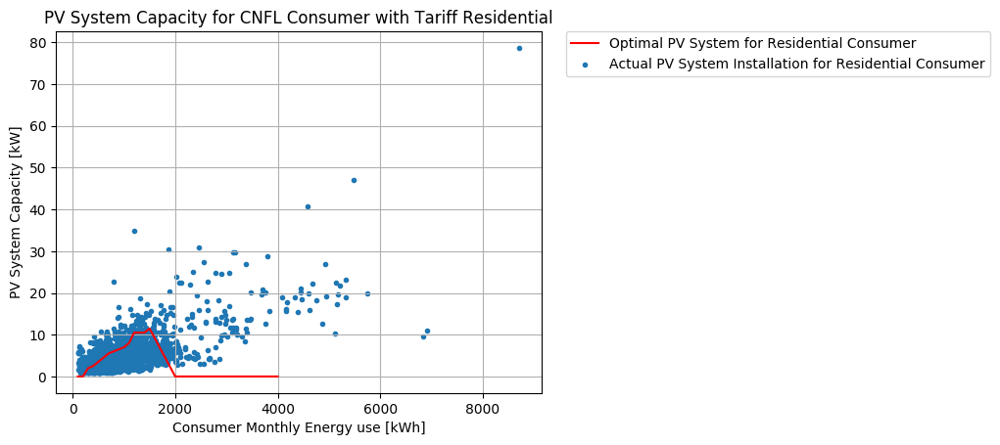

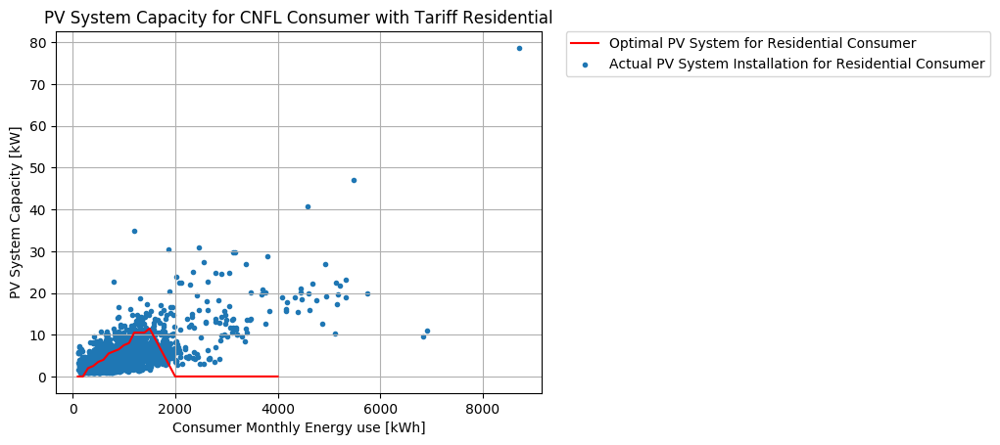

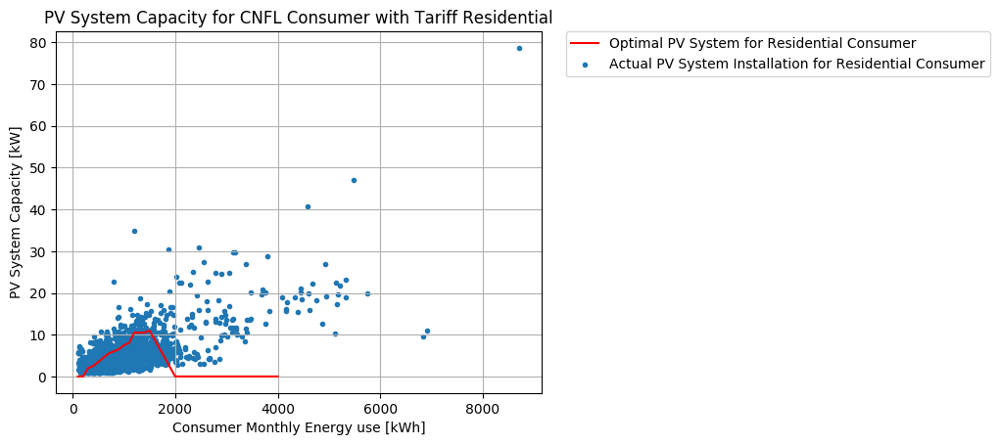

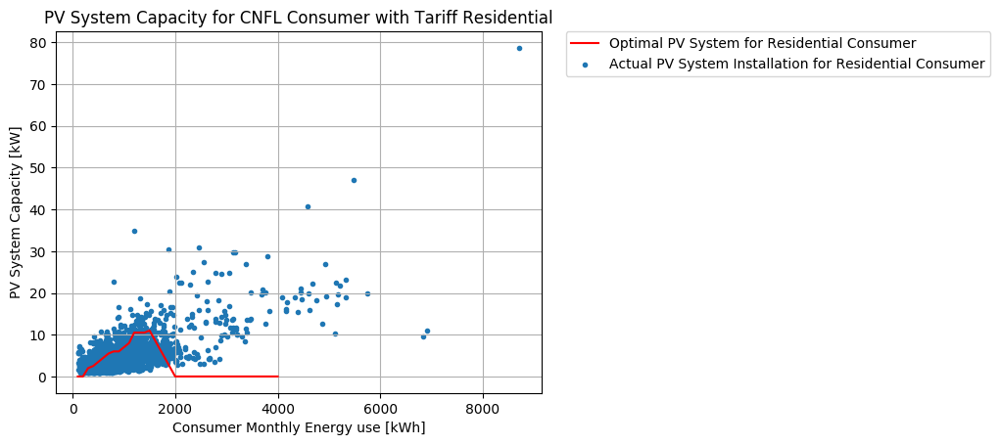

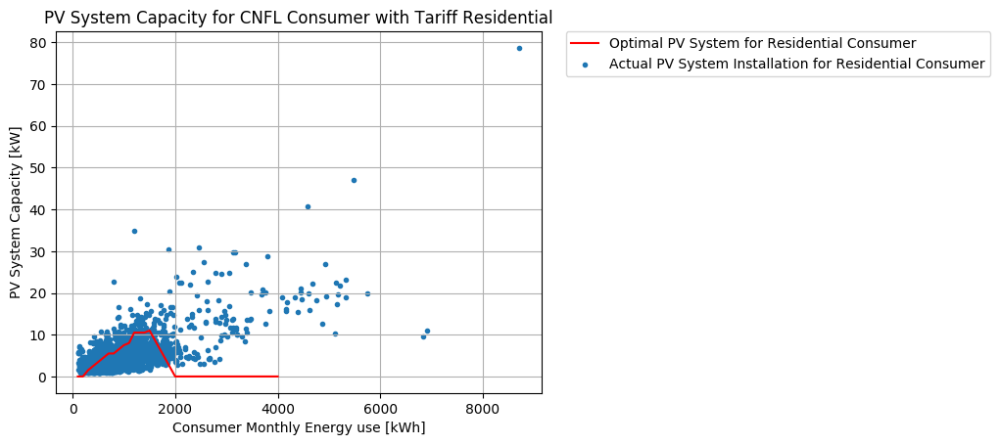

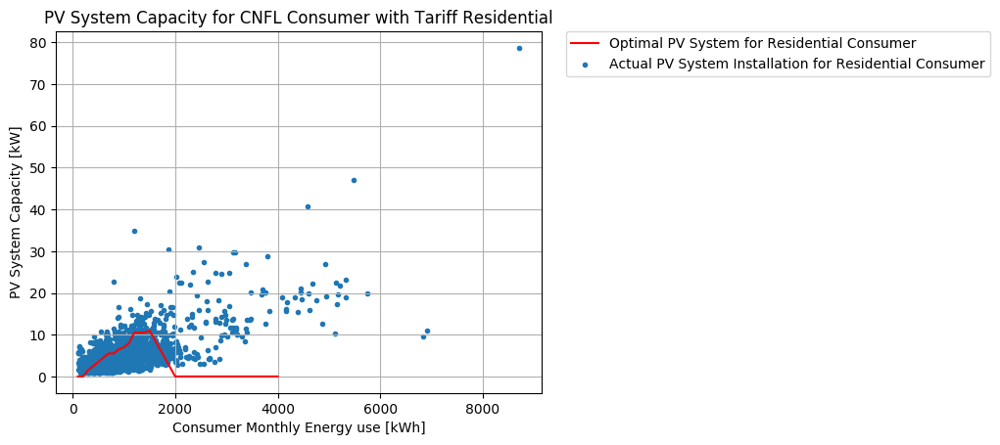

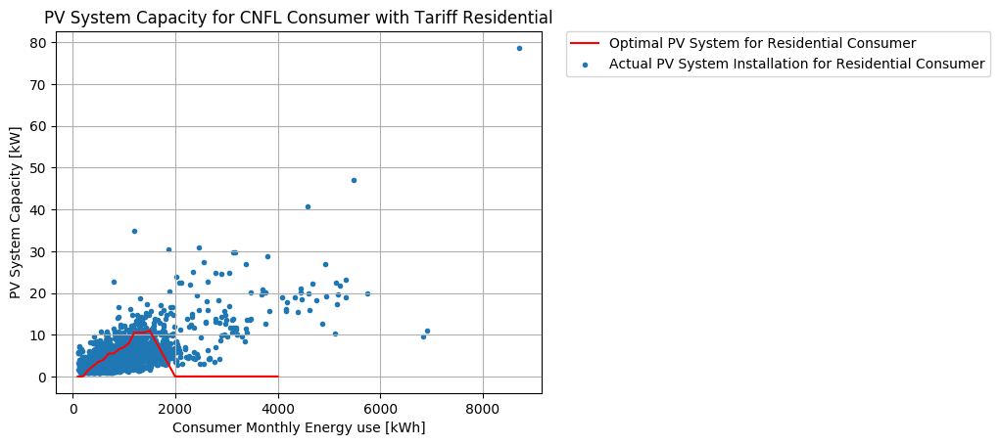

In [10]:
for i in 0.085:0.005:0.12
    get_optimal_capacity(APR=i)
end

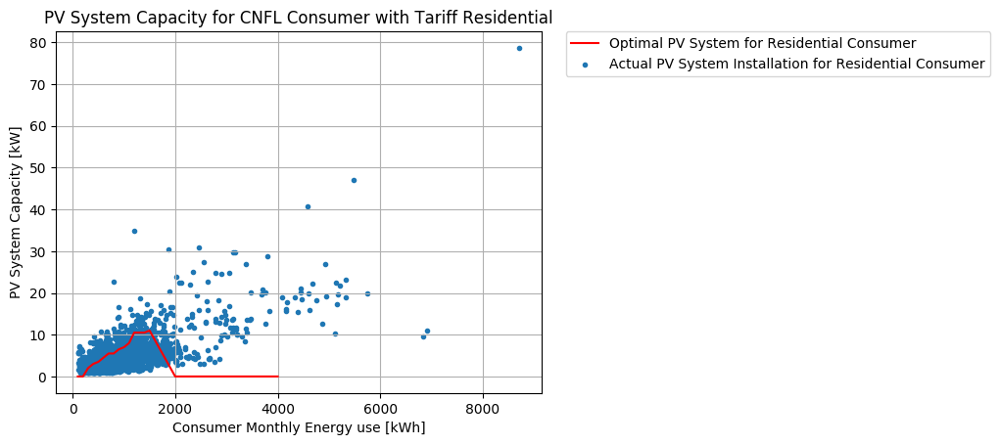

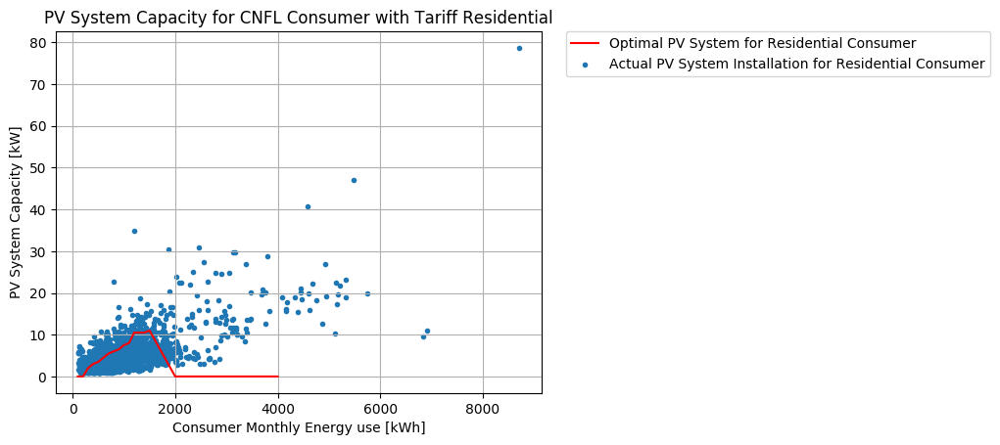

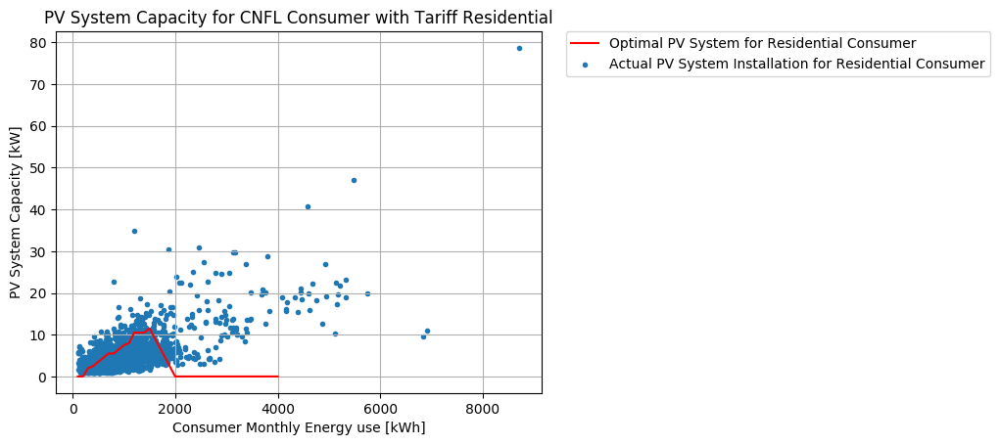

In [11]:
for i in 3:1:5
    get_optimal_capacity(years_to_payoff=i)
end

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = create_consumption_and_installation_arrays(::DataFrame) at plotting_base_gd.jl:74
└ @ Main /Users/arnavgautam/Documents/Research/Jose_Daniel_Lara/arnav_PVCR/functions/plotting_base_gd.jl:74
┌ Warning: `setindex!(df::DataFrame, v::AbstractVector, col_ind::ColumnIndex)` is deprecated, use `begin
│     df[!, col_ind] = v
│     df
│ end` instead.
│   caller = create_consumption_and_installation_arrays(::DataFrame) at plotting_base_gd.jl:74
└ @ Main /Users/arnavgautam/Documents/Research/Jose_Daniel_Lara/arnav_PVCR/functions/plotting_base_gd.jl:74


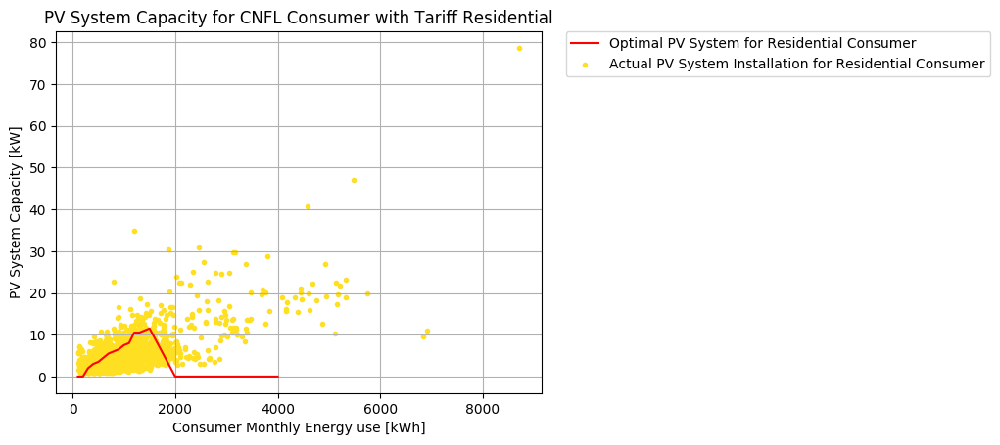

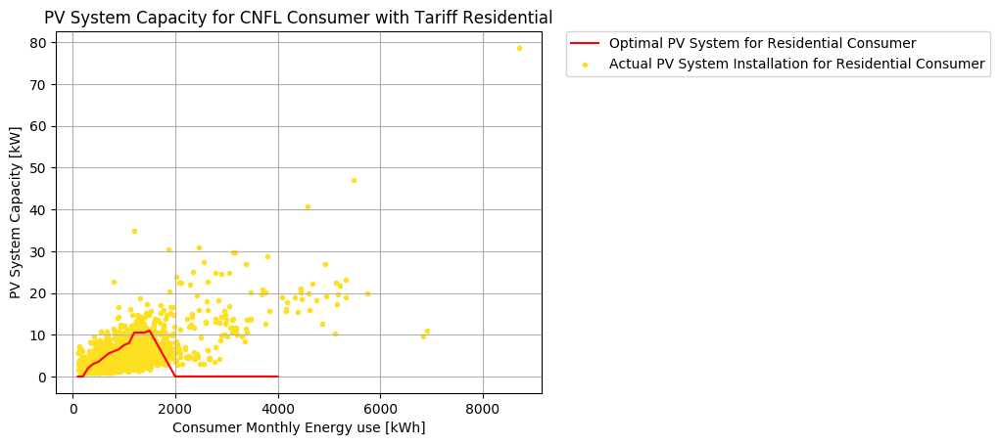

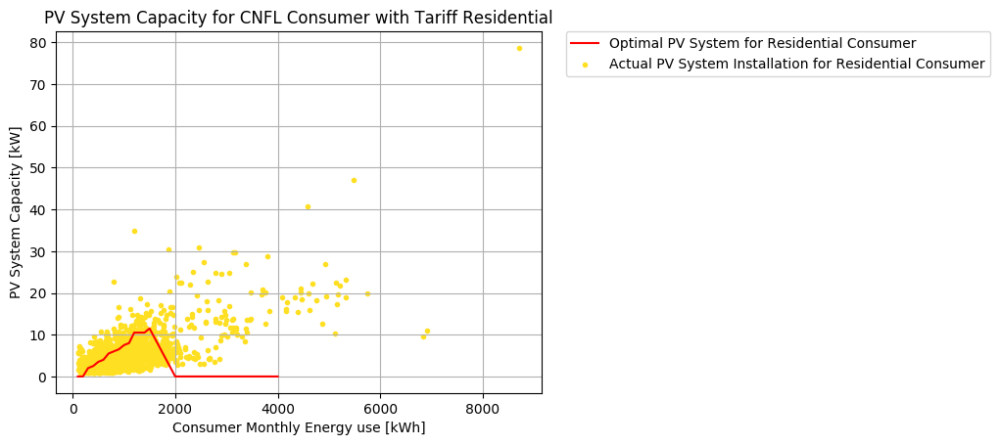

In [6]:
all_aprs = [0.085, 0.1, 0.12]
all_years = [3,4,5]
for i in 1:length(all_aprs)
    apr = all_aprs[i]
    yrs = all_years[i]
    get_optimal_capacity(APR=apr, years_to_payoff=i)
end

In [7]:
changing_apr_model_predictions = []
changing_apr_descriptions = []
for i in 0.085:0.005:0.12
    new_BAC1 = Financial(0.045, i, 5, 0.25, 600.0);
    res_model_predictions = []
    for (ix, co) in enumerate(res_consumption)
        cnfl_residential.econsumption = co; get_pmax(cnfl_residential);
        res = optimal_pv(cnfl_residential, PVRes, 0.0:2:30, new_BAC1, tariff_increase = true)
        push!(res_model_predictions, res[1][2])
    end
    push!(changing_apr_model_predictions, res_model_predictions)
    push!(changing_apr_descriptions, string("APR = ", i))
end

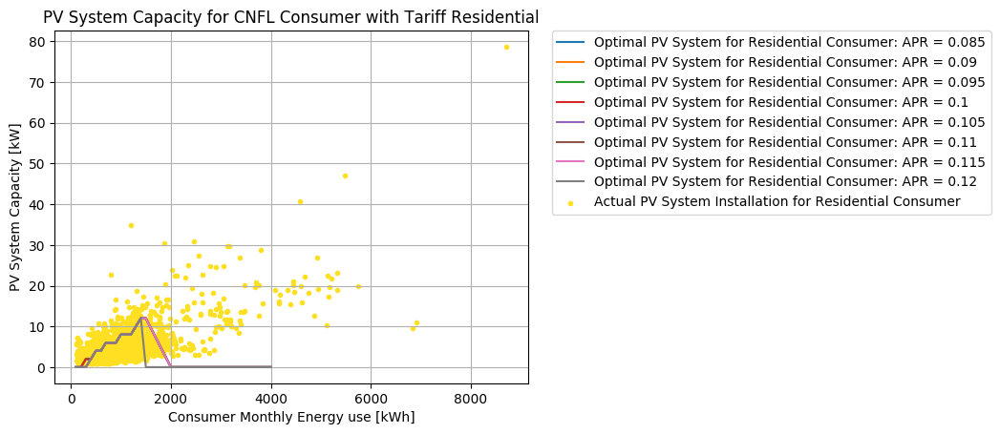

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [13]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, changing_apr_model_predictions; model_descriptions=changing_apr_descriptions)

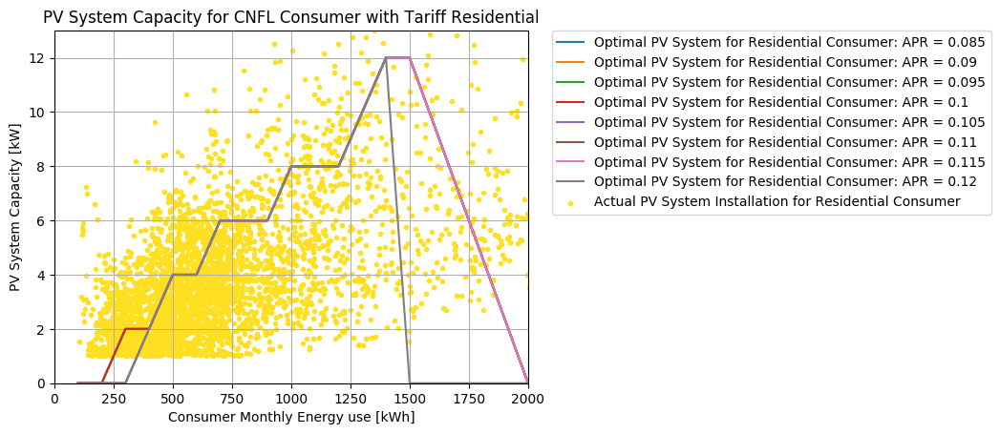

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [14]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, changing_apr_model_predictions; model_descriptions=changing_apr_descriptions, x_max=2000, y_max=13)

In [15]:
changing_years_model_predictions = []
changing_years_descriptions = []
for i in 3:1:5
    new_BAC1 = Financial(0.045, 0.085, i, 0.25, 600.0);
    res_model_predictions = []
    for (ix, co) in enumerate(res_consumption)
        cnfl_residential.econsumption = co; get_pmax(cnfl_residential);
        res = optimal_pv(cnfl_residential, PVRes, 0.0:2:30, new_BAC1, tariff_increase = true)
        push!(res_model_predictions, res[1][2])
    end
    push!(changing_years_model_predictions, res_model_predictions)
    push!(changing_years_descriptions, string("Years till payback = ", i))
end

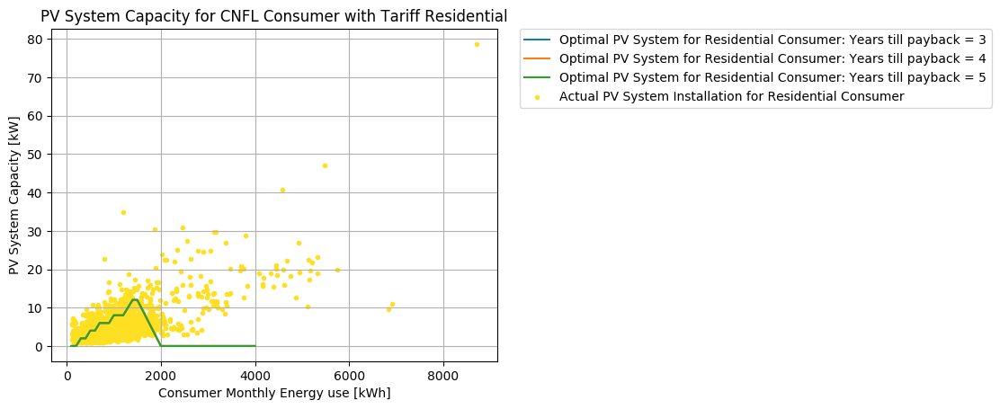

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [16]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, changing_years_model_predictions; model_descriptions=changing_years_descriptions)

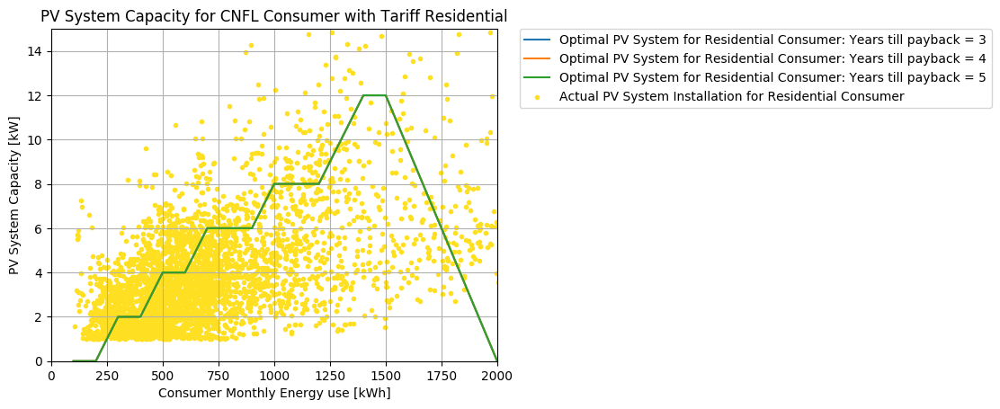

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [18]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, changing_years_model_predictions; model_descriptions=changing_years_descriptions, x_max=2000, y_max=15)

In [20]:
both_inc_model_predictions = []
both_inc_descriptions = []
all_aprs = [0.085, 0.1, 0.12]
all_years = [3,4,5]
for i in 1:length(all_aprs)
    apr = all_aprs[i]
    yrs = all_years[i]
    new_BAC1 = Financial(0.045, apr, yrs, 0.25, 600.0);
    res_model_predictions = []
    for (ix, co) in enumerate(res_consumption)
        cnfl_residential.econsumption = co; get_pmax(cnfl_residential);
        res = optimal_pv(cnfl_residential, PVRes, 0.0:2:30, new_BAC1, tariff_increase = true)
        push!(res_model_predictions, res[1][2])
    end
    push!(both_inc_model_predictions, res_model_predictions)
    push!(both_inc_descriptions, string("APR = ", apr, ", Years = ", yrs))
end

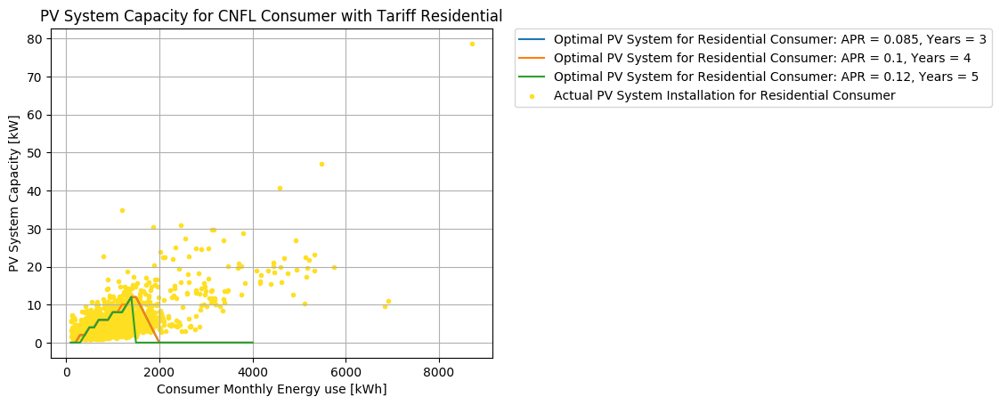

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [21]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, both_inc_model_predictions; model_descriptions=both_inc_descriptions)

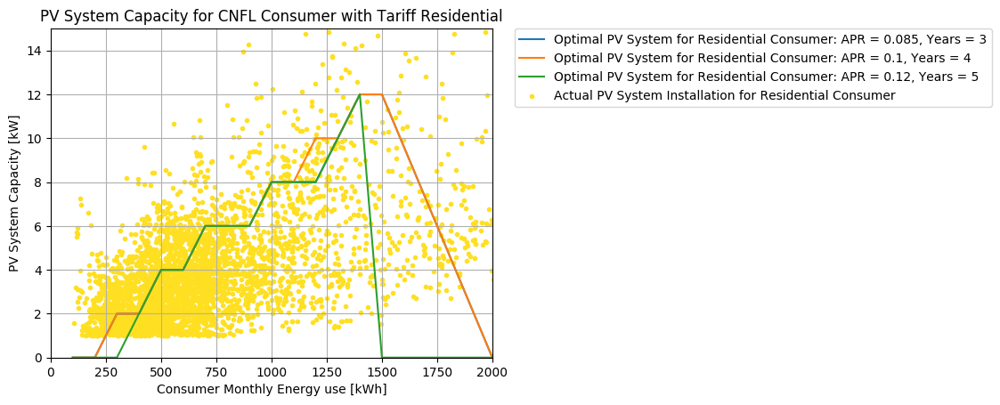

PyObject Text(0.5, 1, 'PV System Capacity for CNFL Consumer with Tariff Residential')

In [22]:
plot_single_tariff_category_per_company_with_model_prediction(all_cnfl, "Residential", "CNFL", res_consumption, both_inc_model_predictions; model_descriptions=both_inc_descriptions, x_max=2000, y_max=15)